# Exploratory Data Analysis on Chicago Crimes

Group Members: Sulaiman, Shubham, Shayan, Ali

# 1- Project Overview

## 1.1 Goal
To harness the power of data to create an efficient and optimized crime-management infrastructure, enabling a proactive approach to public safety in Chicago. By leveraging advanced data analytics, we aim to transform the city's crime data into actionable insights, facilitating the development of a responsive and dynamic crime prevention and response strategy.

## 1.2 Problem Statement
Chicago's complex crime landscape poses significant challenges for effective resource allocation and public safety enhancement. Traditional crime analysis methods may fall short in capturing the intricate patterns of criminal activity that vary across the city's diverse neighborhoods. This project proposes the use of unsupervised learning techniques, including Principal Component Analysis (PCA), clustering, and association rule mining, to delve into the Chicago Crimes dataset. Our aim is to unearth hidden crime patterns, streamline the dataset for more effective analysis, and identify non-obvious relationships between crime attributes. These novel insights are expected to bolster targeted strategies for law enforcement and community safety initiatives, employing a sophisticated, data-driven approach to augment public safety in Chicago.

## 1.3 Business Relevance
This analysis of Chicago crimes can be useful to several sectors or beneficiaries. Law enforcement agencies can leverage these insights for predictive policing and dynamic resource allocation, enhancing their ability to preempt and respond to crime effectively. Business owners can make informed decisions based on the safety profiles of different neighborhoods. Insurance companies may adjust the rates due to neighborhood crime rates. Most importantly, families can use this analysis to select safe neighborhoods to live in Chicago.
So the project’s findings can foster a safer living environment. By providing a foundation for data-driven decision-making, this analysis promises to significantly contribute to the safety and well-being of Chicago's communities.

# 2- Data Overview

## 2.1 Dataset

Chicago Data Portal (https://data.cityofchicago.org/widgets/ijzp-q8t2?)

## 2.2 Data Dictionary

| Column Name           | Data Type | Description                                                                                          |
|-----------------------|-----------|------------------------------------------------------------------------------------------------------|
| ID                    | int       | Unique identifier for the record.                                                                    |
| Case Number           | string    | The Chicago Police Department RD Number (Records Division Number).                                   |
| Date                  | datetime  | Date when the incident occurred. This is sometimes a best estimate.                                 |
| Block                 | string    | The partially redacted address where the incident occurred, placed in the middle of the street block.|
| IUCR                  | string    | The Illinois Uniform Crime Reporting code. This is directly linked to the type of crime that occurred.|
| Primary Type          | string    | The primary description of the IUCR code.                                                            |
| Description           | string    | The secondary description of the IUCR code, a subcategory of the primary type.                       |
| Location Description  | string    | Description of the location where the incident occurred.                                             |
| Arrest                | bool      | Indicates whether an arrest was made.                                                                |
| Domestic              | bool      | Indicates whether the incident was domestic-related as defined by the Illinois Domestic Violence Act. |
| Beat                  | string    | Indicates the beat where the incident occurred. A beat is the smallest police geographic area.       |
| District              | int       | Indicates the police district where the incident occurred.                                           |
| Ward                  | int       | The ward (City Council district) where the incident occurred.                                        |
| Community Area        | string    | Indicates the community area where the incident occurred.                                            |
| FBI Code              | string    | Indicates the crime classification as outlined in the FBI's National Incident-Based Reporting System. |
| X Coordinate          | float     | The X coordinate of the location where the incident occurred.                                        |
| Y Coordinate          | float     | The Y coordinate of the location where the incident occurred.                                        |
| Year                  | int       | Year the incident occurred.                                                                          |
| Updated On            | datetime  | Date and time the record was last updated.                                                          |
| Latitude              | float     | The latitude of the location where the incident occurred.                                            |
| Longitude             | float     | The longitude of the location where the incident occurred.                                           |
| Location              | string    | The location where the incident occurred in a format that allows for mapping and data analysis.      |


# 3- Data Cleaning and Preparation

## 3.1 Importing Libraries

In [ ]:
pip install mlxtend

Defaulting to user installation because normal site-packages is not writeable
  Obtaining dependency information for mlxtend from https://files.pythonhosted.org/packages/1c/07/512f6a780239ad6ce06ce2aa7b4067583f5ddcfc7703a964a082c706a070/mlxtend-0.23.1-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 38.9 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re
import seaborn as sns
import folium
from branca.element import Template, MacroElement
from folium.plugins import FastMarkerCluster
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import LabelEncoder, StandardScaler
import plotly.express as px
from wordcloud import WordCloud

## 3.2 Importing Dataset

In [ ]:
chicago_df = pd.read_csv('/projectnb/ba820/students/shayanhk/Crimes_-_2001_to_Present.csv')

## 3.3 Checking & Cleaning The Data

In [ ]:
chicago_df.head()
chicago_df['Primary Type'].nunique()

36

In [ ]:
chicago_df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

In [ ]:
chicago_df.shape

(7994314, 22)

In [ ]:
chicago_df.isnull().sum()

ID                           0
Case Number                  0
Date                         0
Block                        0
IUCR                         0
Primary Type                 0
Description                  0
Location Description     12499
Arrest                       0
Domestic                     0
Beat                         0
District                    47
Ward                    614853
Community Area          613478
FBI Code                     0
X Coordinate             88053
Y Coordinate             88053
Year                         0
Updated On                   0
Latitude                 88053
Longitude                88053
Location                 88053
dtype: int64

In [ ]:
#Changing the dtype to be datetime
chicago_df['Date'] = pd.to_datetime(chicago_df['Date'], errors='coerce')
chicago_df['Updated On'] = pd.to_datetime(chicago_df['Updated On'], errors='coerce')

#Splitting Date column to Date & Time columns
chicago_df['Crime_Date'] = chicago_df['Date'].dt.date
chicago_df['Crime_Date'] = pd.to_datetime(chicago_df['Crime_Date'], errors='coerce')
chicago_df['Crime_Time'] = chicago_df['Date'].dt.time

/scratch/5235754.1.academic-gpu/ipykernel_2182688/4147620188.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  chicago_df['Updated On'] = pd.to_datetime(chicago_df['Updated On'], errors='coerce')


In [ ]:
chicago_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7994314 entries, 0 to 7994313
Data columns (total 24 columns):
 #   Column                Dtype         
---  ------                -----         
 0   ID                    int64         
 1   Case Number           object        
 2   Date                  datetime64[ns]
 3   Block                 object        
 4   IUCR                  object        
 5   Primary Type          object        
 6   Description           object        
 7   Location Description  object        
 8   Arrest                bool          
 9   Domestic              bool          
 10  Beat                  int64         
 11  District              float64       
 12  Ward                  float64       
 13  Community Area        float64       
 14  FBI Code              object        
 15  X Coordinate          float64       
 16  Y Coordinate          float64       
 17  Year                  int64         
 18  Updated On            datetime64[ns]
 19  

In [ ]:
# saving the first 100 rows of the chicago_df as a csv file

df_first_100 = chicago_df.head(100)

# Save the first 100 rows to an Excel file
df_first_100.to_excel('first_100_rows.xlsx', index=False)

In [ ]:
# Dropping 'Ward' and 'Community Area' columns, and then dropping rows with missing 'Latitude' or 'Longitude' values

cleaned_chicago_df = chicago_df.drop(['Ward', 'Community Area'], axis=1).dropna(subset=['Latitude', 'Longitude', 'Location', 'District', 'X Coordinate', 'Y Coordinate', 'District', 'Location Description'])
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,06,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,08B,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,04A,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,08B,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,04B,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00


In [ ]:
cleaned_chicago_df['Time_Category'] = cleaned_chicago_df['Crime_Time'].apply(
    lambda x: 'Morning' if 6 <= x.hour < 12 else
              ('Afternoon' if 12 <= x.hour < 18 else
               ('Evening' if 18 <= x.hour < 24 else 'Night'))
)

In [ ]:
cleaned_chicago_df.isnull().sum()

ID                      0
Case Number             0
Date                    0
Block                   0
IUCR                    0
Primary Type            0
Description             0
Location Description    0
Arrest                  0
Domestic                0
Beat                    0
District                0
FBI Code                0
X Coordinate            0
Y Coordinate            0
Year                    0
Updated On              0
Latitude                0
Longitude               0
Location                0
Crime_Date              0
Crime_Time              0
Time_Category           0
dtype: int64

In [ ]:
cleaned_chicago_df.shape

(7898273, 23)

In [ ]:
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon


### 3.3.1 Distribution of Crimes by Type

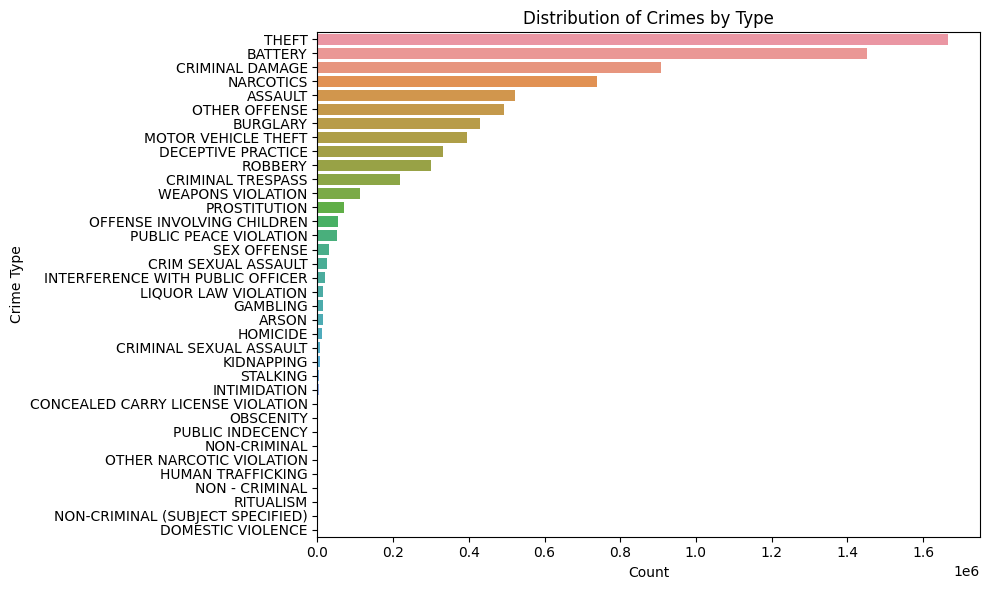

In [ ]:
# plot to identify which type of crime is the most common

plt.figure(figsize=(10, 6))
sns.countplot(y='Primary Type', data=cleaned_chicago_df, order=cleaned_chicago_df['Primary Type'].value_counts().index)
plt.title('Distribution of Crimes by Type')
plt.xlabel('Count')
plt.ylabel('Crime Type')
plt.tight_layout()

### 3.3.2 Time Series Analysis on Number of Crimes Per Month

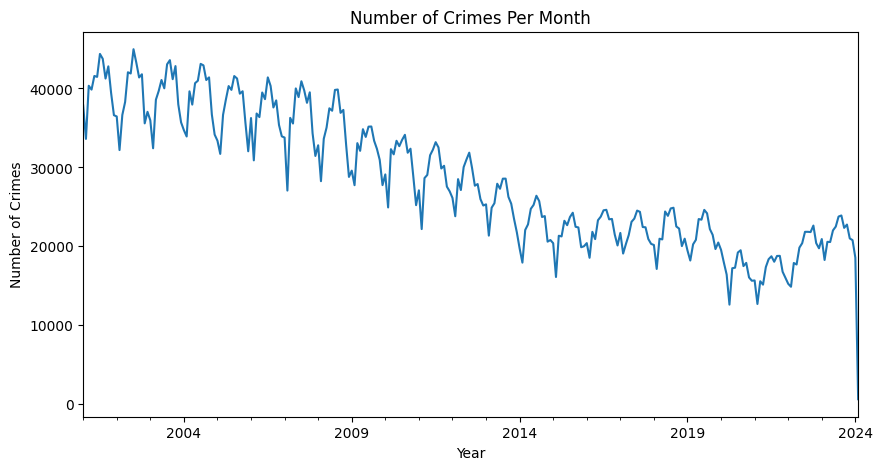

In [ ]:
monthly_crimes = cleaned_chicago_df.groupby(cleaned_chicago_df['Crime_Date'].dt.to_period('M')).size()

monthly_crimes.plot(figsize=(10,5))
plt.title('Number of Crimes Per Month')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.show()

The time series graph shows the number of crimes per month in Chicago over two decades. There's a clear downward trend in crime, with periodic peaks that could correspond to seasonal trends or specific events. The most recent data shows a significant drop, possibly indicating a sharp decrease in crime or a change in data reporting.

### 3.3.3 Heatmap of Top Crime Types and Top Location Descriptions

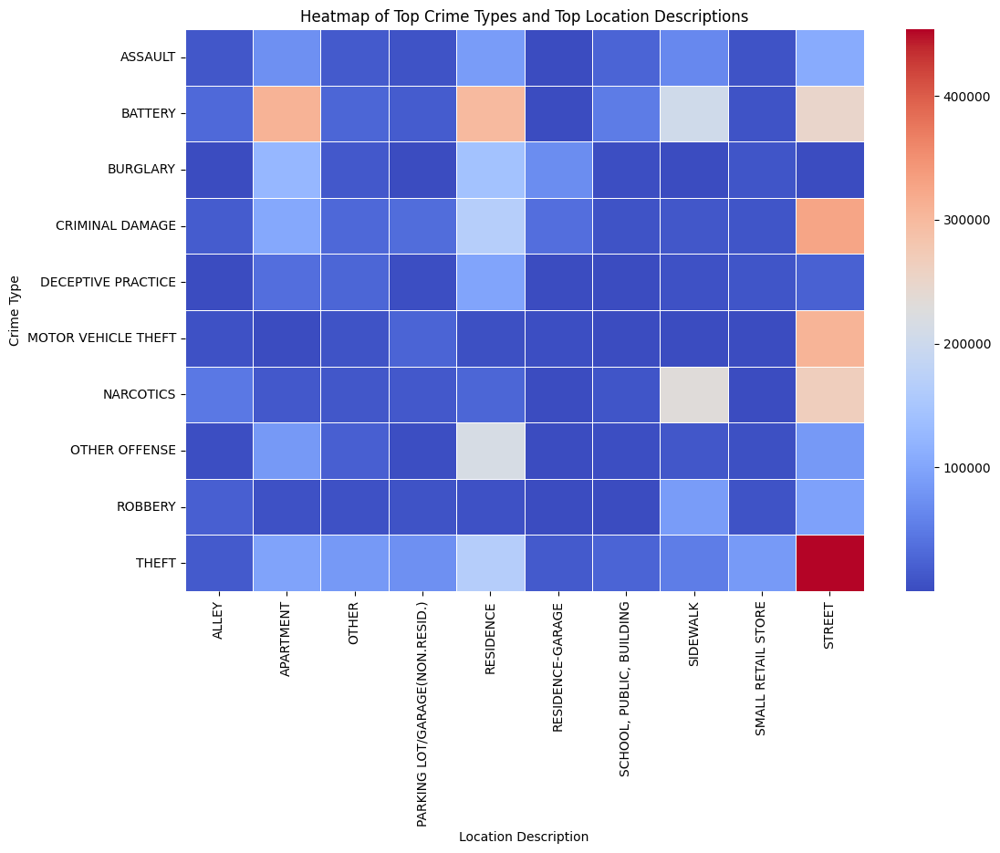

In [ ]:
top_crimes = cleaned_chicago_df['Primary Type'].value_counts().head(10).index
top_locations = cleaned_chicago_df['Location Description'].value_counts().head(10).index

top_df = cleaned_chicago_df[cleaned_chicago_df['Primary Type'].isin(top_crimes) &
                            cleaned_chicago_df['Location Description'].isin(top_locations)]

crime_location_crosstab = pd.crosstab(top_df['Primary Type'],
                                      top_df['Location Description'])

plt.figure(figsize=(12, 8))
sns.heatmap(crime_location_crosstab, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Heatmap of Top Crime Types and Top Location Descriptions')
plt.ylabel('Crime Type')
plt.xlabel('Location Description')
plt.show()

The heatmap shows where different crimes happen most. Theft often occurs in apartments and on streets. Drug-related crimes happen in specific places. Other crimes and property damage are common in many areas.

### 3.3.4 Category Analysis on Crimes leading to Arrest

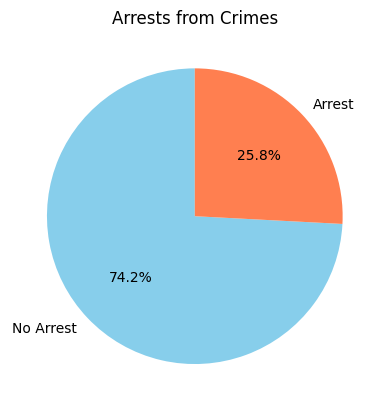

In [ ]:
arrests = cleaned_chicago_df['Arrest'].value_counts()

colors = ['skyblue', 'coral']

arrests.plot(kind='pie', autopct='%1.1f%%', startangle=90, labels=['No Arrest', 'Arrest'], colors=colors)
plt.title('Arrests from Crimes')
plt.ylabel('')
plt.show()

The pie chart shows that about a quarter of reported crimes result in an arrest in Chicago. The majority of cases, nearly three-quarters, do not lead to an arrest, indicating potential challenges in law enforcement or case closure.

Data Cleaning & Preperation done by all members: <br>
EDA Organization & Data Dictionary by Sulaiman and Shubham <br>
Cleaning & coding by Shayan and Shubham<br>
Visualization by Shubham<br>
Project Overview by Ali and Shubham<br>

# 4- Clustering

## 4.1 Hierarchical clustering

In [ ]:
time_encoder = LabelEncoder()
cleaned_chicago_df['Time_Category_Encoded'] = time_encoder.fit_transform(cleaned_chicago_df['Time_Category'])
limited_df = cleaned_chicago_df.head(100).copy()
limited_df['Primary Type Encoded'] = time_encoder.fit_transform(limited_df['Primary Type'])


X = limited_df[['Time_Category_Encoded', 'Primary Type Encoded']]

num_clusters = 3
method = 'complete'
Z = linkage(X, method)
limited_df['cluster_labels'] = fcluster(Z, num_clusters, criterion='maxclust')

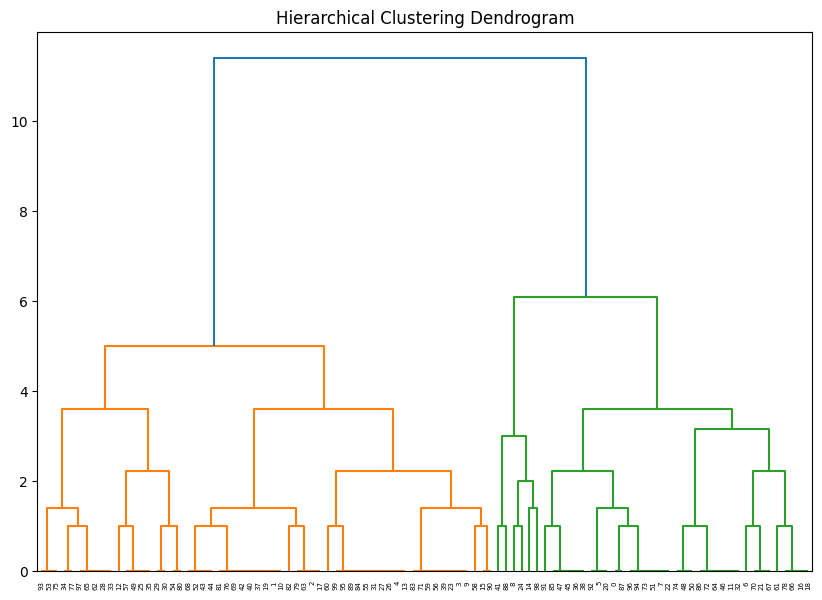

In [ ]:
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram')
dn = dendrogram(Z)
plt.show()

In the analysis of Chicago crime data, hierarchical clustering was applied to identify distinct patterns based on crime types and the time of day. The process involved encoding these two variables and utilizing the 'complete' linkage method to establish hierarchical relationships. The analysis was visualized through a dendrogram, which facilitated the identification of three significant clusters by revealing a notable jump in dissimilarity after the third cluster merge. This approach effectively segmented the crime data into three distinct groups, uncovering unique patterns of criminal activity across different times, and provided insights into the temporal and categorical nature of crimes in Chicago.

Hierarchical clustering contributed by Ali

## 4.2 K-MEANS

### 4.2.1 Using Elbow Method to find the Optimal K

In [ ]:
X = cleaned_chicago_df[['Latitude', 'Longitude']]

/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureW

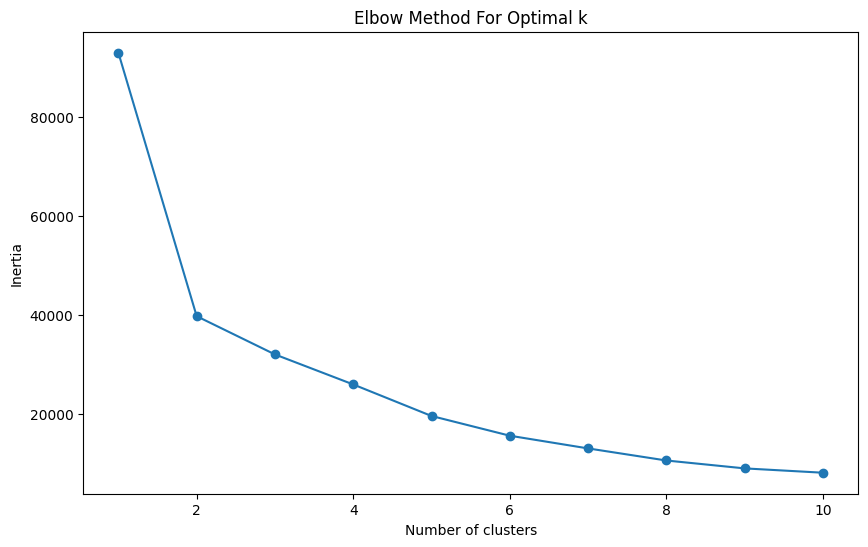

In [ ]:
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

From the elbow method above, it's clear that using 2 clusters would be a good clustering choice.

### 4.2.2 Perform k-means based on the result from the elbow method

In [ ]:
k = 2

kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(X)

cleaned_chicago_df['Cluster'] = clusters

/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [ ]:
limited_df = cleaned_chicago_df.head(100).copy()

In [ ]:
limited_df

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category,Time_Category_Encoded,Cluster
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning,2,0
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night,3,0
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning,2,0
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening,1,0
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253,12069994,JD254699,2020-06-05 14:15:00,011XX S TROY ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,True,...,2020,2020-06-12 15:41:20,41.867653,-87.704485,"(41.867652634, -87.704485374)",2020-06-05,14:15:00,Afternoon,0,1
254,12195675,JD402139,2020-10-16 18:00:00,016XX N WASHTENAW AVE,0890,THEFT,FROM BUILDING,HOTEL / MOTEL,False,False,...,2020,2020-12-17 15:40:05,41.911036,-87.694563,"(41.911036489, -87.694562787)",2020-10-16,18:00:00,Evening,1,1
255,12064652,JD249002,2020-05-31 19:30:00,117XX S HALSTED ST,1310,CRIMINAL DAMAGE,TO PROPERTY,PARKING LOT / GARAGE (NON RESIDENTIAL),False,False,...,2020,2020-06-07 15:41:45,41.681110,-87.642018,"(41.681109736, -87.642018411)",2020-05-31,19:30:00,Evening,1,0
256,12102405,JD292702,2020-07-09 14:58:00,002XX E 47TH ST,0930,MOTOR VEHICLE THEFT,THEFT / RECOVERY - AUTOMOBILE,STREET,False,False,...,2020,2020-07-16 15:42:49,41.809317,-87.620757,"(41.80931735, -87.620757235)",2020-07-09,14:58:00,Afternoon,0,0


### 4.2.3 Perform k-means Clustering on the limited df

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=42)
limited_df['Cluster'] = kmeans.fit_predict(limited_df[['Latitude', 'Longitude']])


/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


### 4.2.4 Visualize the Clusters on the Map

In [ ]:
map_center = [limited_df['Latitude'].mean(), limited_df['Longitude'].mean()]

chicago_map = folium.Map(location=map_center, zoom_start=12)

colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

for _, row in limited_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[int(row['Cluster']) % len(colors)],
        fill=True,
        fill_color=colors[int(row['Cluster']) % len(colors)],
        fill_opacity=0.7,
        popup=f"Crime Type: {row['Primary Type']}"
    ).add_to(chicago_map)

# Generate the legend HTML
legend_html = '<div style="position: fixed; bottom: 50px; left: 50px; width: 150px; height: {}px; background-color: white; border:2px solid grey; z-index: 9999; font-size: 14px; padding: 5px;"><b>Legend</b><br>'.format(25 * len(colors))
for i, color in enumerate(colors):
    legend_html += f'<i style="background: {color}; width: 10px; height: 10px; margin-right: 5px; display: inline-block;"></i> Cluster {i}<br>'
legend_html += '</div>'

# Add the legend to the map
legend = MacroElement()
legend._template = Template(legend_html)
chicago_map.get_root().add_child(legend)

# Save the map to an HTML file
chicago_map.save('updated_1_chicago_crime_clusters_with_legend.html')

In [ ]:
cluster_centers = kmeans.cluster_centers_
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

chicago_map.add_child(FastMarkerCluster(cleaned_chicago_df[['Latitude', 'Longitude']].values.tolist()))

for i, center in enumerate(cluster_centers):
    folium.CircleMarker(
        location=[center[1], center[0]],
        radius=10,
        color=colors[i % len(colors)],
        fill=True,
        fill_color=colors[i % len(colors)],
        fill_opacity=0.7,
        popup=f"Cluster Center: {i}"
    ).add_to(chicago_map)

# Save the map to an HTML file
chicago_map.save('chicago_crime_clusters_centers.html')

Trying the above map with fast marker cluster with the whole Dataset (cleaned_chicago_df) created a very large file that cannot be opened on the browser, so we need to reduce the df

### 4.2.5 Visualize the Clusters on the Map with reduced df (60%)

In [ ]:
sixtypercent_df = cleaned_chicago_df.sample(frac=0.6, random_state=42)

In [ ]:
sixtypercent_df.shape

(4738556, 25)

By reducing the df to 60%, we end up with 4,738,964 crimes

In [ ]:
cluster_centers = kmeans.cluster_centers_

chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

chicago_map.add_child(FastMarkerCluster(sixtypercent_df[['Latitude', 'Longitude']].values.tolist()))

for i, center in enumerate(cluster_centers):
    folium.CircleMarker(
        location=[center[1], center[0]], # Assuming [latitude, longitude] order
        radius=10,
        color=colors[i % len(colors)],
        fill=True,
        fill_color=colors[i % len(colors)],
        fill_opacity=0.7,
        popup=f"Cluster Center: {i}"
    ).add_to(chicago_map)

# Save the map to an HTML file
chicago_map.save('fraction_of_chicago_crime_clusters_centers.html')

K-means done by Shubham & Sulaiman

# 5- TF-IDF

# 5.1 Implementing TF-IDF for this dataset

In [ ]:
# Preprocessing
cleaned_chicago_df['Text'] = cleaned_chicago_df['Primary Type'] + ' ' + cleaned_chicago_df['Description']
cleaned_chicago_df['Text'] = cleaned_chicago_df['Text'].str.lower()

# TF-IDF Transformation
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(cleaned_chicago_df['Text'])

# Analysis
le = LabelEncoder()
y = le.fit_transform(cleaned_chicago_df['Primary Type'])
y = (y == le.transform(['HOMICIDE'])[0]).astype(int)  # 1 for 'HOMICIDE', 0 for everything else

X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.4, random_state=42, stratify=y)

nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

y_pred = nb_classifier.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

0.9999924027504575
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   3153816
           1       1.00      1.00      1.00      5222

    accuracy                           1.00   3159038
   macro avg       1.00      1.00      1.00   3159038
weighted avg       1.00      1.00      1.00   3159038



From the above result by using the TF-IDF technique on Chicago crime data, we trained a model to spot 'HOMICIDE' instances. It reached almost 100% accuracy, which, while impressive, may hint at overfitting or data inconsistencies that need further investigation.

In [ ]:
cv = CountVectorizer()

X = cv.fit_transform(cleaned_chicago_df['Description'])

word_counts = X.toarray().sum(axis=0)

feature_names = cv.get_feature_names_out()

word_count_dict = dict(zip(feature_names, word_counts))

top_15_words = sorted(word_count_dict.items(), key=lambda x: x[1], reverse=True)[:15]
for word, count in top_15_words:
    print(f'{word}: {count}')

simple: 1554924
to: 1097361
500: 1065912
under: 674195
domestic: 672207
battery: 672113
and: 659602
poss: 611600
over: 513086
vehicle: 496834
property: 452097
theft: 426567
entry: 421989
aggravated: 421072
automobile: 358257


Utilizing text analysis, we applied a CountVectorizer to extract word frequencies. From this, we identified the top 15 most frequent words, which included common terms like 'simple', 'domestic', and 'battery'.

In [ ]:
num_unique_primary_types = cleaned_chicago_df['Primary Type'].nunique()
num_unique_primary_types

36

From the above code, we can say that we have 36 unique crime type.

## 5.2 Creating a Word Cloud for each Crime Types

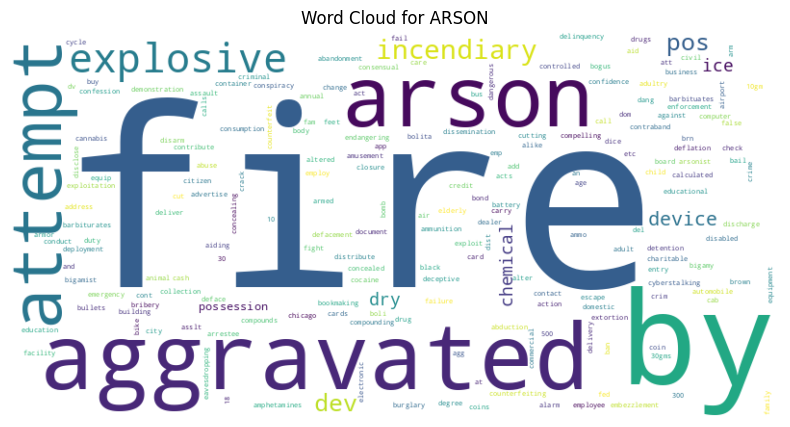

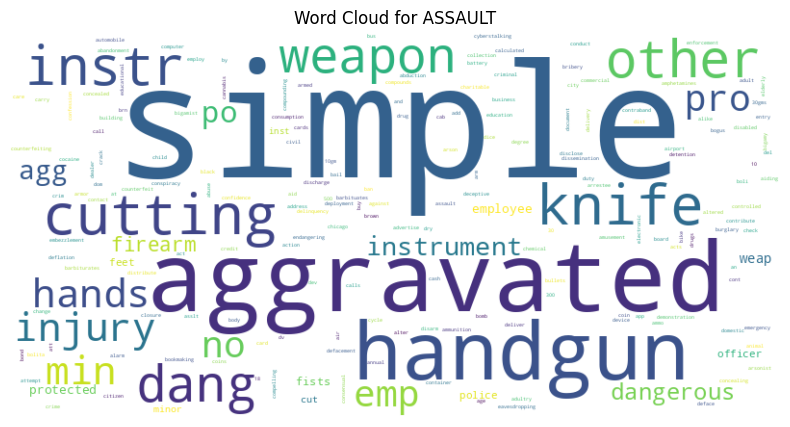

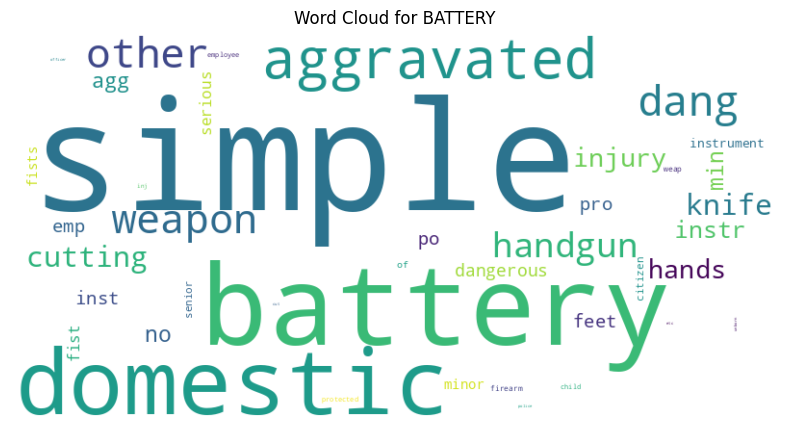

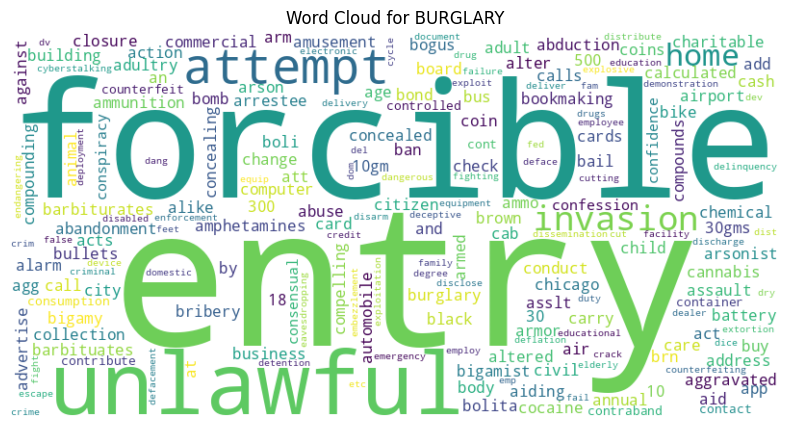

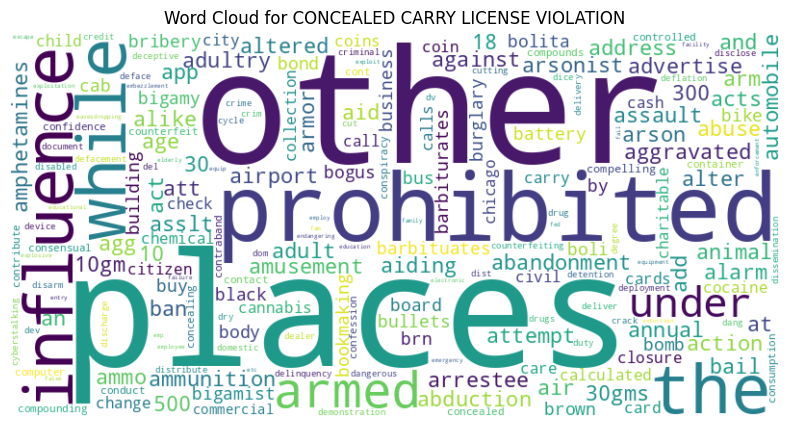

...

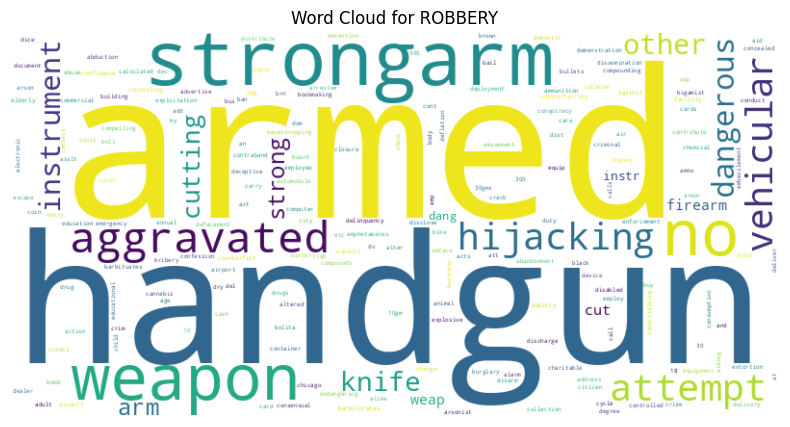

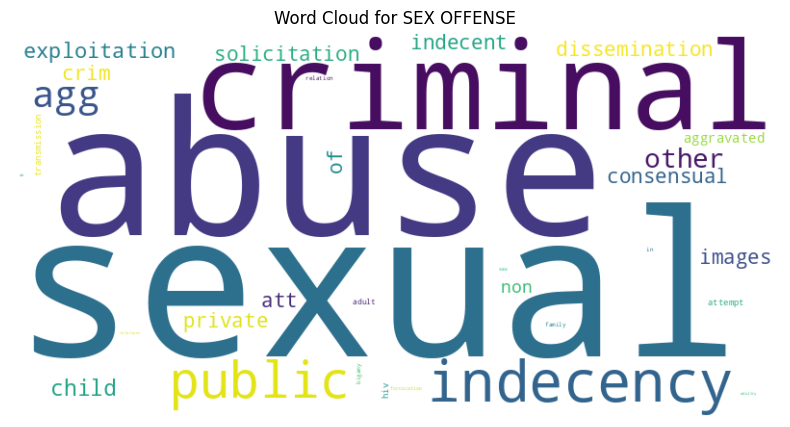

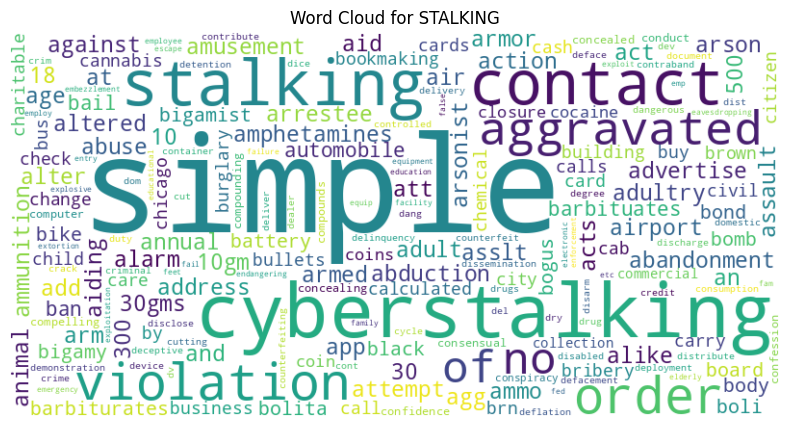

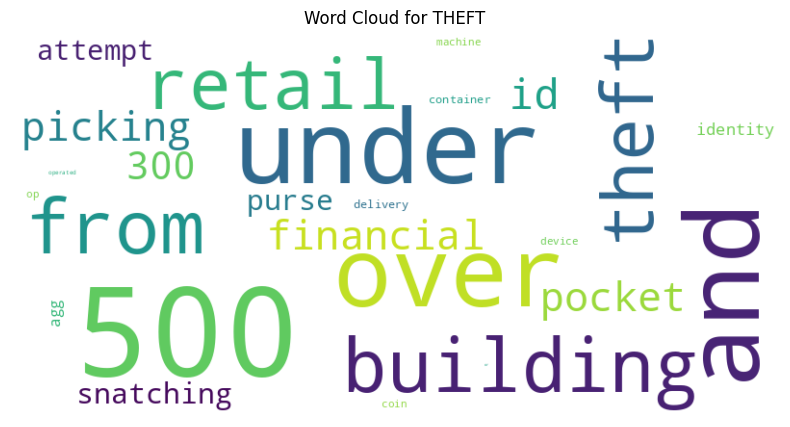

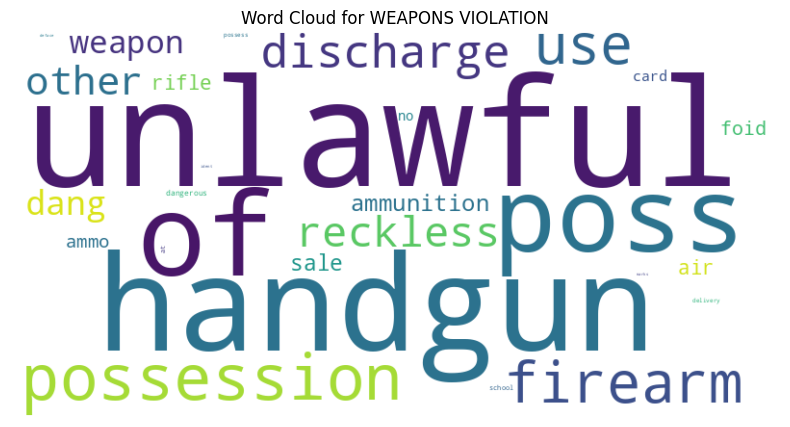

In [ ]:
tfidf_vectorizer = TfidfVectorizer()

X_tfidf = tfidf_vectorizer.fit_transform(cleaned_chicago_df['Description'])

le = LabelEncoder()

y_encoded = le.fit_transform(cleaned_chicago_df['Primary Type'])

model = MultinomialNB()

model.fit(X_tfidf, y_encoded)

feature_names = tfidf_vectorizer.get_feature_names_out()

output_directory = '/projectnb/ba820/students/sm242002/'

for i, crime_type in enumerate(le.classes_):
    log_prob = model.feature_log_prob_[i]

    word_probs = np.exp(log_prob)

    word_probs_dict = dict(zip(feature_names, word_probs))

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_probs_dict)

    # Saving the word cloud as PNG
    output_path = f"{output_directory}{crime_type.replace('/', '_')}_wordcloud.png"
    wordcloud.to_file(output_path)

    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {crime_type}')
    plt.show()

In [ ]:
cleaned_chicago_df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'FBI Code', 'X Coordinate', 'Y Coordinate', 'Year',
       'Updated On', 'Latitude', 'Longitude', 'Location', 'Crime_Date',
       'Crime_Time', 'Time_Category', 'Time_Category_Encoded', 'Cluster',
       'Text'],
      dtype='object')

From the above result, we've created a word cloud for each crime type

## 5.3 Classification Report for Tokenized Text

In [ ]:
pip install TextBlob

Defaulting to user installation because normal site-packages is not writeable
  Obtaining dependency information for TextBlob from https://files.pythonhosted.org/packages/02/07/5fd2945356dd839974d3a25de8a142dc37293c21315729a41e775b5f3569/textblob-0.18.0.post0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 21.6 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

The above code eliminates the limit for the number of maximum columns and rows displayed in pandas for our convenience when we later perform TF-DF.

In [ ]:
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category,Time_Category_Encoded,Cluster,Text
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,212,2.0,06,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning,2,0,theft $500 and under
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,915,9.0,08B,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night,3,0,battery simple
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,422,4.0,04A,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning,2,0,assault aggravated - handgun
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,726,7.0,08B,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening,1,0,battery simple
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,712,7.0,04B,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon,0,0,battery aggravated: other dang weapon


<Axes: >

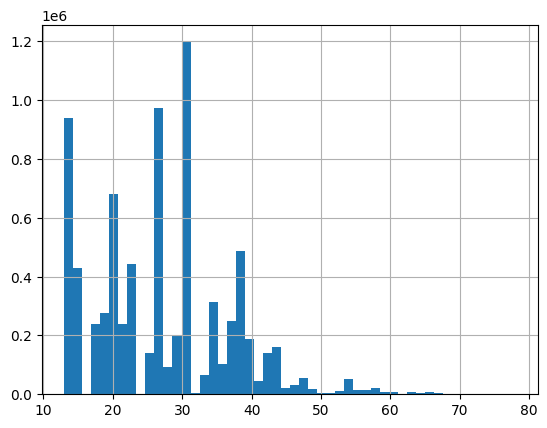

In [ ]:
cleaned_chicago_df["Text"].apply(lambda x: len(x)).hist(bins=50)

The above code block adds a function to the "Text" column of the chicago_cleaned_df and calculates the length of each text entry to output a histogram of 50 bins

In [ ]:
from nltk.corpus import stopwords
import nltk
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')

tfidf_small_df = cleaned_chicago_df.iloc[:100000].copy()

tfidf_small_df["text_prcessed"] = tfidf_small_df["Text"].str.lower()

tfidf_small_df["text_prcessed"] = tfidf_small_df["text_prcessed"].replace('', ' ', regex=True)

tfidf_small_df["text_prcessed"] = tfidf_small_df["text_prcessed"].replace('[^\w\d\s]', ' ', regex=True)


tokenized_reviews = [word_tokenize(review) for review in tfidf_small_df["text_prcessed"]]

stop_words = set(stopwords.words('english'))

for indx, tokens in enumerate(tokenized_reviews):
  tokenized_reviews[indx] = [word for word in tokens if word not in stop_words]


tfidf_small_df["tokenized"] = tokenized_reviews

<>:13: DeprecationWarning: invalid escape sequence '\w'
<>:13: DeprecationWarning: invalid escape sequence '\w'
/scratch/5216786.1.academic-gpu/ipykernel_3313454/891302506.py:13: DeprecationWarning: invalid escape sequence '\w'
  tfidf_small_df["text_prcessed"] = tfidf_small_df["text_prcessed"].replace('[^\w\d\s]', ' ', regex=True)
[nltk_data] Downloading package stopwords to
[nltk_data]     /usr3/graduate/sm242002/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /usr3/graduate/sm242002/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


The above code performs preporcessing and tokenization of the first 1,00,000 rows of the chicago_cleaned_df. We are using only 10% subset of the dataset since it takes a lot of time to process it and because of time constraint and efficiency we will be using a small subset of our main dataset.

In [ ]:
tfidf_small_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category,Time_Category_Encoded,Cluster,Text,YearMonth,Label,text_prcessed,tokenized
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,212,2.0,06,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning,2,0,theft $500 and under,2020-05,0,theft 500 and under,"[theft, 500]"
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,915,9.0,08B,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night,3,0,battery simple,2020-04,1,battery simple,"[battery, simple]"
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,422,4.0,04A,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning,2,0,assault aggravated - handgun,2020-07,1,assault aggravated handgun,"[assault, aggravated, handgun]"
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,726,7.0,08B,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening,1,0,battery simple,2020-09,1,battery simple,"[battery, simple]"
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,712,7.0,04B,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon,0,0,battery aggravated: other dang weapon,2005-07,1,battery aggravated other dang weapon,"[battery, aggravated, dang, weapon]"


In [ ]:
import gensim.downloader as api
import numpy as np
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec

model_word2vec = Word2Vec(sentences=tokenized_reviews, vector_size=100, window=5, min_count=1, workers=2)
model_word2vec = model_word2vec.wv

Here, the above code block initializes the Word2Vec model and takes in the tokenized text from "tokenized_reviews" as we learnt in our class. This model will generate 100 dimensional word embeddings within a 5 word context window.

### 5.3.1 Word2Vec

In [ ]:
import nltk
nltk.download('punkt')

def get_word_embedding(word, model):
    if word in model.key_to_index:
        return model[word]
    else:
        return np.zeros(model.vector_size)


embeddings = []
for review in tokenized_reviews:
  review_embeddings = [get_word_embedding(word, model_word2vec) for word in review ]
  review_embedding = np.mean(review_embeddings if len(review_embeddings) >0 else [np.zeros(model_word2vec.vector_size)], axis=0)
  embeddings = embeddings + [review_embedding]

embeddings = np.array(embeddings)

[nltk_data] Downloading package punkt to
[nltk_data]     /usr3/graduate/sm242002/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


This above code block is the reason why we have used only 1,00,000 rows of the dataset since it defines a function to extract word embeddings from a trained Word2Vec model and then performs the calculation for average vector for each tokenized review.

In [ ]:
embeddings.shape

(100000, 100)

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

labels_array = np.unique(y_test)

target_names = le.inverse_transform(labels_array)

report = classification_report(y_test, y_pred, labels=labels_array, target_names=target_names, zero_division=0)
print(report)

              precision    recall  f1-score   support

       ARSON       0.75      0.21      0.33        14
     ASSAULT       0.48      0.91      0.62        11

    accuracy                           0.52        25
   macro avg       0.61      0.56      0.48        25
weighted avg       0.63      0.52      0.46        25



This shows us the result of the classification which we have performed as in the above code cells.

## 5.4 Using TFIDF Vectorizer to Create Distrubution of Predicted Crime Labels

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt

brutal_keywords = ['assault', 'battery', 'murder', 'homicide', 'manslaughter', 'rape', 'kidnapping']

tfidf_small_df['Label'] = tfidf_small_df['Text'].apply(lambda text: any(keyword in text.lower() for keyword in brutal_keywords))

tfidf_small_df['Label'] = tfidf_small_df['Label'].astype(int)

tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
X_tfidf = tfidf_vectorizer.fit_transform(subset_df['Text'])

model = LogisticRegression()
model.fit(X_tfidf, subset_df['Label'])

predicted_labels = model.predict(X_tfidf)


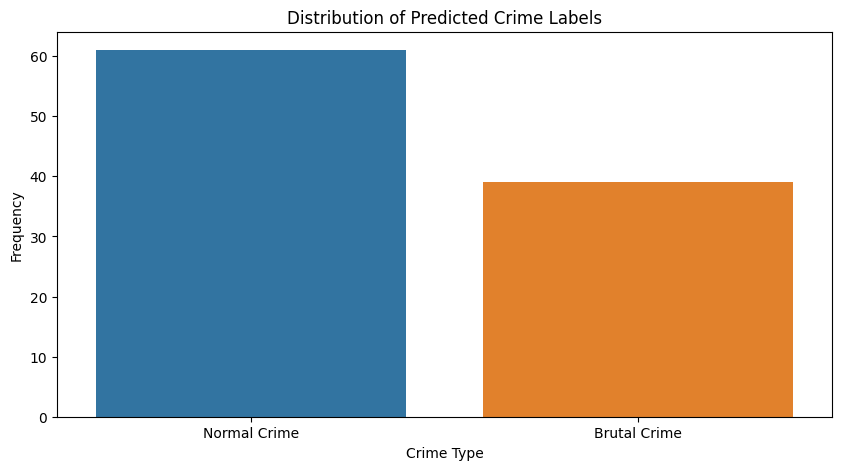

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(x=predicted_labels)
plt.xticks(ticks=[0, 1], labels=['Normal Crime', 'Brutal Crime'])
plt.title('Distribution of Predicted Crime Labels')
plt.xlabel('Crime Type')
plt.ylabel('Frequency')
plt.show()

In this section of TF-DF and logistic regression, we are classifying text descriptions of crimes into 2 categories "Normal Crime" and "Brutal Crime" based on the dictionaries of bins we have created.

TF-IDF done by Shubham

# 6- Association Rule Mining

In [ ]:
cleaned_chicago_df.shape

(7898273, 23)

In [ ]:
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon


In [ ]:
df_2024 = cleaned_chicago_df[cleaned_chicago_df['Year'] == 2024]
df_2024

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category
157567,13360393,JH142536,2024-01-11 00:00:00,008XX S MICHIGAN AVE,1365,CRIMINAL TRESPASS,TO RESIDENCE,APARTMENT,False,False,...,1177400.0,1896564.0,2024,2024-02-08 15:41:15,41.871504,-87.624161,"(41.871504164, -87.624160788)",2024-01-11,00:00:00,Night
157587,13360477,JH142313,2024-01-08 10:44:00,053XX N MILWAUKEE AVE,1110,DECEPTIVE PRACTICE,BOGUS CHECK,OTHER (SPECIFY),False,False,...,1137735.0,1934679.0,2024,2024-02-08 15:41:15,41.976903,-87.768867,"(41.976902894, -87.768866564)",2024-01-08,10:44:00,Morning
157588,13360476,JH142346,2024-01-11 12:00:00,059XX W IRVING PARK RD,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,BANK,False,False,...,1135817.0,1925980.0,2024,2024-02-08 15:41:15,41.953066,-87.776128,"(41.953066476, -87.776128044)",2024-01-11,12:00:00,Afternoon
157589,13360524,JH142718,2024-01-25 00:00:00,048XX S ELIZABETH ST,0440,BATTERY,"AGGRAVATED - HANDS, FISTS, FEET, NO / MINOR IN...",APARTMENT,False,False,...,1168808.0,1872675.0,2024,2024-02-08 15:41:15,41.806141,-87.656396,"(41.806140974, -87.656396363)",2024-01-25,00:00:00,Night
157590,13360515,JH142772,2024-01-25 11:49:00,069XX N KEDZIE AVE,0890,THEFT,FROM BUILDING,APARTMENT,False,False,...,1153857.0,1945811.0,2024,2024-02-08 15:41:15,42.007143,-87.709280,"(42.007142825, -87.709280128)",2024-01-25,11:49:00,Morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211548,13356212,JH136760,2024-02-01 19:36:00,019XX N HUMBOLDT BLVD,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,...,1156062.0,1912811.0,2024,2024-02-09 15:41:38,41.916544,-87.702062,"(41.91654447, -87.702061981)",2024-02-01,19:36:00,Evening
211549,13355986,JH136241,2024-02-01 12:30:00,035XX W ADAMS ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,...,1152863.0,1898846.0,2024,2024-02-09 15:41:38,41.878287,-87.714185,"(41.87828717, -87.714185338)",2024-02-01,12:30:00,Afternoon
211550,13355707,JH136906,2024-02-01 22:58:00,005XX N RIDGEWAY AVE,2024,NARCOTICS,POSSESS - HEROIN (WHITE),ALLEY,True,False,...,1151293.0,1903272.0,2024,2024-02-09 15:41:38,41.890464,-87.719834,"(41.890463519, -87.719833886)",2024-02-01,22:58:00,Evening
211552,13355396,JH136298,2024-02-01 13:35:00,073XX S UNION AVE,0430,BATTERY,AGGRAVATED - OTHER DANGEROUS WEAPON,APARTMENT,False,False,...,1172902.0,1856243.0,2024,2024-02-09 15:41:38,41.760960,-87.641866,"(41.760960264, -87.641865746)",2024-02-01,13:35:00,Afternoon


In [ ]:
df_2024['Primary Type'].nunique()

27

In [ ]:
selected_data = df_2024[['Primary Type', 'Location Description']]
transactions = selected_data.groupby('Location Description')['Primary Type'].apply(list).reset_index(name='Primary Types')
transactions = transactions['Primary Types'].tolist()


In [ ]:
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df = pd.DataFrame(te_ary, columns=te.columns_)

df

,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,HOMICIDE,...,OBSCENITY,OFFENSE INVOLVING CHILDREN,OTHER OFFENSE,PROSTITUTION,PUBLIC PEACE VIOLATION,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION
0,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,True,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,True,False
2,False,False,True,False,False,True,False,False,True,False,...,False,False,True,False,False,False,False,False,False,False
3,False,True,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,False,True,True,False,False,False,False,True,True,False,...,False,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
96,False,False,True,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
97,False,False,True,False,False,False,False,False,True,False,...,False,False,False,False,False,False,True,False,True,False
98,True,True,True,True,False,True,True,True,True,False,...,False,False,True,False,False,True,False,False,True,True


We took the 2024 crime data and grouped the types of crimes happening at each place. Then, I converted that into a table where each crime type is a column. Looking at it, we can see which crimes often occur together at the same spots.

# 6.1 Finding interesting Associations

In [ ]:
frequent_itemsets = apriori(df, min_support=0.15, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.64,(ASSAULT)
1,0.67,(BATTERY)
2,0.37,(BURGLARY)
3,0.59,(CRIMINAL DAMAGE)
4,0.19,(CRIMINAL SEXUAL ASSAULT)
...,...,...
2390,0.15,"(WEAPONS VIOLATION, BATTERY, THEFT, OTHER OFFE..."
2391,0.17,"(WEAPONS VIOLATION, BATTERY, THEFT, OTHER OFFE..."
2392,0.15,"(MOTOR VEHICLE THEFT, BURGLARY, THEFT, OTHER O..."
2393,0.15,"(MOTOR VEHICLE THEFT, BATTERY, BURGLARY, THEFT..."


Using the apriori algorithm, we analyzed the 2024 crime data for frequent patterns. setting the minimum support to 0.15 to find the common crime combinations.<br>
For example, battery and assault often occurs together. These insights can aid in understanding crime trends and preventing future incidents.

In [ ]:
rules = association_rules(frequent_itemsets, metric="support", min_threshold=0.05)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(ASSAULT),(BATTERY),0.64,0.67,0.52,0.812500,1.212687,0.0912,1.760000,0.487179
1,(BATTERY),(ASSAULT),0.67,0.64,0.52,0.776119,1.212687,0.0912,1.608000,0.531469
2,(ASSAULT),(BURGLARY),0.64,0.37,0.32,0.500000,1.351351,0.0832,1.260000,0.722222
3,(BURGLARY),(ASSAULT),0.37,0.64,0.32,0.864865,1.351351,0.0832,2.664000,0.412698
4,(ASSAULT),(CRIMINAL DAMAGE),0.64,0.59,0.51,0.796875,1.350636,0.1324,2.018462,0.721133
...,...,...,...,...,...,...,...,...,...,...
121007,(CRIMINAL DAMAGE),"(MOTOR VEHICLE THEFT, BATTERY, BURGLARY, THEFT...",0.59,0.15,0.15,0.254237,1.694915,0.0615,1.139773,1.000000
121008,(ASSAULT),"(MOTOR VEHICLE THEFT, BATTERY, BURGLARY, THEFT...",0.64,0.15,0.15,0.234375,1.562500,0.0540,1.110204,1.000000
121009,(DECEPTIVE PRACTICE),"(MOTOR VEHICLE THEFT, BATTERY, BURGLARY, THEFT...",0.53,0.15,0.15,0.283019,1.886792,0.0705,1.185526,1.000000
121010,(CRIMINAL TRESPASS),"(MOTOR VEHICLE THEFT, BATTERY, BURGLARY, THEFT...",0.45,0.15,0.15,0.333333,2.222222,0.0825,1.275000,1.000000


The data indicates a 77% confidence in the co-occurrence of battery and assault crimes. Additionally, the presence of burglary also suggests a high likelihood of assault, pointing to common crime patterns.

## 6.2 Top 5 Associations

In [ ]:
top_5 = rules.sort_values(by='confidence', ascending=False).head(10)

top_5

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
50466,"(MOTOR VEHICLE THEFT, THEFT, CRIMINAL DAMAGE, ...",(BATTERY),0.20,0.67,0.20,1.0,1.492537,0.0660,inf,0.412500
107266,"(BURGLARY, THEFT, OTHER OFFENSE, ASSAULT, DECE...",(CRIMINAL DAMAGE),0.18,0.59,0.18,1.0,1.694915,0.0738,inf,0.500000
47063,"(BATTERY, BURGLARY, DECEPTIVE PRACTICE, CRIMIN...","(CRIMINAL DAMAGE, THEFT)",0.24,0.57,0.24,1.0,1.754386,0.1032,inf,0.565789
107268,"(BURGLARY, OTHER OFFENSE, CRIMINAL DAMAGE, ASS...",(THEFT),0.18,0.75,0.18,1.0,1.333333,0.0450,inf,0.304878
27058,"(OTHER OFFENSE, DECEPTIVE PRACTICE, CRIMINAL T...",(THEFT),0.23,0.75,0.23,1.0,1.333333,0.0575,inf,0.324675
118021,"(WEAPONS VIOLATION, BATTERY, OTHER OFFENSE, NA...","(CRIMINAL TRESPASS, CRIMINAL DAMAGE, THEFT)",0.15,0.36,0.15,1.0,2.777778,0.0960,inf,0.752941
7246,"(CRIMINAL SEXUAL ASSAULT, DECEPTIVE PRACTICE, ...",(THEFT),0.16,0.75,0.16,1.0,1.333333,0.0400,inf,0.297619
7247,"(CRIMINAL SEXUAL ASSAULT, DECEPTIVE PRACTICE, ...",(CRIMINAL DAMAGE),0.16,0.59,0.16,1.0,1.694915,0.0656,inf,0.488095
7250,"(CRIMINAL SEXUAL ASSAULT, DECEPTIVE PRACTICE)","(CRIMINAL DAMAGE, THEFT)",0.16,0.57,0.16,1.0,1.754386,0.0688,inf,0.511905
107265,"(BURGLARY, THEFT, OTHER OFFENSE, CRIMINAL DAMA...",(ASSAULT),0.18,0.64,0.18,1.0,1.562500,0.0648,inf,0.439024


The data reveals specific and strong patterns of crime sequences in Chicago for the year 2024, where certain combinations of crimes consistently lead to specific outcomes. Here's a summary of what these patterns imply:

1. **Prevalent Crime Sequences**: Certain types of crimes, notably involving motor vehicle theft, burglary, and various forms of deception and assault, are found to precede specific outcomes like battery, criminal damage, and theft with a 100% certainty. This indicates that these antecedent activities are reliable predictors of the consequent crimes listed.

2. **Critical Areas for Law Enforcement Focus**: The analysis identifies key crime types such as motor vehicle theft, burglary, and assault that frequently lead to further offenses. Targeting these antecedent crimes through focused policing and community intervention could disrupt the cycle, potentially reducing the occurrence of the consequent crimes.

3. **High-Risk Combinations for Further Investigation**: The dataset highlights high-risk crime combinations, such as those involving weapons violations, narcotics, and sexual assault, that lead to significant property and violent crimes. These could be due to the fact that these situations often escalate and turn into other crimes.

In summary, the data uncovers distinct patterns in criminal activity, pointing towards potential strategies for preemptive action and resource optimization in law enforcement efforts. By understanding and acting on these patterns, there is a possibility to reduce crime through more informed and targeted approaches.

Association Rule Mining contributed by Shayan

## 6.3 Checking Association for Crimes for 2024 by time of day

In [ ]:
periods = ['Morning', 'Afternoon', 'Evening', 'Night']
periods

['Morning', 'Afternoon', 'Evening', 'Night']

In [ ]:
for period in periods:
    print(f"Analysis for {period}:")

    selected_data = df_2024[['Primary Type', 'Location Description']]
    transactions = selected_data.groupby('Location Description')['Primary Type'].apply(list).reset_index(name='Primary Types')
    transactions = transactions['Primary Types'].tolist()

    te = TransactionEncoder()
    te_ary = te.fit(transactions).transform(transactions)
    df = pd.DataFrame(te_ary, columns=te.columns_)

    frequent_itemsets = apriori(df, min_support=0.15, use_colnames=True)

    rules = association_rules(frequent_itemsets, metric="support", min_threshold=0.05)

    top_recommendations = rules.sort_values(by='confidence', ascending=False).head(5)
    print(top_recommendations[['antecedents', 'consequents', 'support', 'confidence', 'lift']])
    print("\n")


Analysis for Morning:
                                              antecedents  \
50466   (MOTOR VEHICLE THEFT, THEFT, CRIMINAL DAMAGE, ...   
107266  (BURGLARY, THEFT, OTHER OFFENSE, ASSAULT, DECE...   
47063   (BATTERY, BURGLARY, DECEPTIVE PRACTICE, CRIMIN...   
107268  (BURGLARY, OTHER OFFENSE, CRIMINAL DAMAGE, ASS...   
27058   (OTHER OFFENSE, DECEPTIVE PRACTICE, CRIMINAL T...   

                     consequents  support  confidence      lift  
50466                  (BATTERY)     0.20         1.0  1.492537  
107266         (CRIMINAL DAMAGE)     0.18         1.0  1.694915  
47063   (CRIMINAL DAMAGE, THEFT)     0.24         1.0  1.754386  
107268                   (THEFT)     0.18         1.0  1.333333  
27058                    (THEFT)     0.23         1.0  1.333333  


Analysis for Afternoon:
                                              antecedents  \
50466   (MOTOR VEHICLE THEFT, THEFT, CRIMINAL DAMAGE, ...   
107266  (BURGLARY, THEFT, OTHER OFFENSE, ASSAULT, DECE...   
47063 

Now I have separated the dataset of crimes in 2024 into times of the day: Morning, Afternoon, Evening, and Night and have tried to find association between crimes at various times of the day. This analysis shows that the rules and their metrics are consistent across these time periods, which implies:

1. Persistent Crime Patterns:
    The same sets of crimes tend to occur together or lead to one another regardless of the time of day. This consistency across different times suggests that these patterns are robust and likely represent significant trends in criminal activity within Chicago.

2. Specific Insights:
    1. The occurrence of crimes like "MOTOR VEHICLE THEFT, THEFT, CRIMINAL DAMAGE" together frequently leads to "BATTERY," with a significant support and lift indicating a strong and common pattern. This occurs frequently regardless of the time of day.
    2.  The combination of "BURGLARY, THEFT, OTHER OFFENSE, ASSAULT, DECEPTIVE PRACTICE" leading to "CRIMINAL DAMAGE" shows a notable pattern with a lift of 1.6949, suggesting this sequence of events is more likely than random chance.

3. Utility of This Analysis:
    These insights are invaluable for law enforcement and public safety officials. They highlight specific patterns of criminal behavior that can inform strategic decisions, such as where to allocate resources more effectively, how to predict and prevent certain types of crime, and which crime sequences to disrupt to potentially prevent further criminal activities. This analytical approach allows for a more data-driven strategy in combating crime in Chicago.

## 6.4 Checking Associations for Crimes for the past two Years (2023-2024)

In [ ]:
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon


In [ ]:
df_23_24 = cleaned_chicago_df[cleaned_chicago_df['Year']>=2023]
df_23_24.shape

(278624, 23)

In [ ]:
periods = ['Morning', 'Afternoon', 'Evening', 'Night']
periods

['Morning', 'Afternoon', 'Evening', 'Night']

In [ ]:
selected_data = df_23_24[['Primary Type', 'Location Description']]
transactions = selected_data.groupby('Location Description')['Primary Type'].apply(list).reset_index(name='Primary Types')
transactions = transactions['Primary Types'].tolist()

te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df = pd.DataFrame(te_ary, columns=te.columns_)

frequent_itemsets = apriori(df, min_support=0.25, use_colnames=True)

rules = association_rules(frequent_itemsets, metric="support", min_threshold=0.05)

In [ ]:
top_recommendations = rules.sort_values(by='confidence', ascending=False).head(10)
print(top_recommendations[['antecedents', 'consequents', 'support', 'confidence', 'lift']])
print("\n")

                                               antecedents  \
5294352  (BATTERY, OTHER OFFENSE, NARCOTICS, OFFENSE IN...   
5404607  (OTHER OFFENSE, CRIMINAL DAMAGE, NARCOTICS, AS...   
5404584  (BATTERY, NARCOTICS, ASSAULT, INTERFERENCE WIT...   
5404589  (THEFT, OTHER OFFENSE, CRIMINAL DAMAGE, NARCOT...   
5404596  (THEFT, OTHER OFFENSE, NARCOTICS, ASSAULT, INT...   
5404598  (THEFT, OTHER OFFENSE, NARCOTICS, INTERFERENCE...   
5404601  (THEFT, CRIMINAL DAMAGE, NARCOTICS, ASSAULT, I...   
5404603  (THEFT, CRIMINAL DAMAGE, NARCOTICS, INTERFEREN...   
5404605  (THEFT, NARCOTICS, ASSAULT, INTERFERENCE WITH ...   
5404609  (OTHER OFFENSE, CRIMINAL DAMAGE, NARCOTICS, IN...   

                                            consequents   support  confidence  \
5294352                      (ASSAULT, CRIMINAL DAMAGE)  0.270677         1.0   
5404607            (BATTERY, DECEPTIVE PRACTICE, THEFT)  0.255639         1.0   
5404584         (OTHER OFFENSE, CRIMINAL DAMAGE, THEFT)  0.255639         

Here is a breakdown of the patterns identified in the crimes data from 2023 to 2024:

1. Narcotics Related Offenses Leading to Violence and Property Damage: The presence of narcotics in the antecedents is a common thread across many rules, suggesting that drug-related offenses often co-occur with or precede a range of other crimes. Specifically, these narcotics-related offenses are linked to subsequent acts of assault, battery, and criminal damage, highlighting the potential violent and destructive outcomes associated with drug crimes.

2. Theft and Criminal Damage as Common Outcomes: Theft and criminal damage appear frequently as consequents, indicating that these types of property crimes are common follow-ups to a variety of crime combinations. This suggests a pattern where initial offenses, including narcotics and assault, may escalate to or involve theft and damage to property.

3. Variety in Crime Combinations: The diversity in the antecedent combinations, ranging from offenses involving narcotics, battery, assault, and interference with public officers, to other offenses and criminal damage, illustrates the complex nature of crime sequences. This complexity reflects the multifaceted nature of criminal behavior and the various paths through which different crimes are connected.

4. Specific Sequences Indicate Targeted Intervention Points: The specificity of the sequences identified, such as the link between narcotics and assault or the connection between other offenses and deceptive practice, theft, and battery, provides actionable insights for law enforcement. Targeting interventions at the antecedent stage could disrupt these patterns, potentially preventing the consequent crimes from occurring.


Contributed by Shayan